Re-sampling

In [9]:
import os
import librosa
import torch
import soundfile as sf

# Check if CUDA is available and set the device
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

# Paths
input_folder = 'D:\\Project\\LjSpeech\\wavs'  # Folder where the original .wav files are stored
output_folder = 'resampled_wavs'  # Folder to save the resampled .wav files
target_sr = 22050  # Target sampling rate

# Create the output folder if it doesn't exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Loop through all .wav files in the input folder
for file_name in os.listdir(input_folder):
    if file_name.endswith('.wav'):
        # Full path to the input file
        input_file_path = os.path.join(input_folder, file_name)

        # Load the audio file with librosa
        waveform, sr = librosa.load(input_file_path, sr=None)  # sr=None ensures original sample rate is kept

        # Resample the audio if the sample rate is different from the target
        if sr != target_sr:
            waveform = librosa.resample(waveform, orig_sr=sr, target_sr=target_sr)

        # Convert the waveform to a PyTorch tensor and transfer to the GPU
        waveform_tensor = torch.tensor(waveform, device=device).unsqueeze(0)  # Add batch dimension

        # Transfer back to CPU for saving
        waveform_tensor = waveform_tensor.cpu().squeeze(0).numpy()  # Remove batch dimension and convert to numpy

        # Full path to the output file
        output_file_path = os.path.join(output_folder, file_name)

        # Save the resampled audio using soundfile
        sf.write(output_file_path, waveform_tensor, target_sr)

        print(f"Resampled {file_name} and saved to {output_file_path}")

print("All files have been resampled and saved.")


Resampled 1.wav and saved to resampled_wavs\1.wav
Resampled 10.wav and saved to resampled_wavs\10.wav
Resampled 100.wav and saved to resampled_wavs\100.wav
Resampled 1000.wav and saved to resampled_wavs\1000.wav
Resampled 10000.wav and saved to resampled_wavs\10000.wav
Resampled 10001.wav and saved to resampled_wavs\10001.wav
Resampled 10002.wav and saved to resampled_wavs\10002.wav
Resampled 10003.wav and saved to resampled_wavs\10003.wav
Resampled 10004.wav and saved to resampled_wavs\10004.wav
Resampled 10005.wav and saved to resampled_wavs\10005.wav
Resampled 10006.wav and saved to resampled_wavs\10006.wav
Resampled 10007.wav and saved to resampled_wavs\10007.wav
Resampled 10008.wav and saved to resampled_wavs\10008.wav
Resampled 10009.wav and saved to resampled_wavs\10009.wav
Resampled 1001.wav and saved to resampled_wavs\1001.wav
Resampled 10010.wav and saved to resampled_wavs\10010.wav
Resampled 10011.wav and saved to resampled_wavs\10011.wav
Resampled 10012.wav and saved to res

Silence Trimming

In [10]:
import os
import librosa
import soundfile as sf

# Paths
input_folder = 'resampled_wavs'  # Folder where the resampled .wav files are stored
output_folder = 'trimmed_wavs'   # Folder to save the trimmed .wav files

# Create the output folder if it doesn't exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Loop through all .wav files in the input folder
for file_name in os.listdir(input_folder):
    if file_name.endswith('.wav'):
        # Full path to the input file
        input_file_path = os.path.join(input_folder, file_name)

        # Load the audio file
        waveform, sr = librosa.load(input_file_path, sr=None)

        # Perform silence trimming
        trimmed_waveform, _ = librosa.effects.trim(waveform, top_db=20)

        # Full path to the output file
        output_file_path = os.path.join(output_folder, file_name)

        # Save the trimmed audio to the new folder
        sf.write(output_file_path, trimmed_waveform, sr)

        print(f"Trimmed {file_name} and saved to {output_file_path}")


Trimmed 1.wav and saved to trimmed_wavs\1.wav
Trimmed 10.wav and saved to trimmed_wavs\10.wav
Trimmed 100.wav and saved to trimmed_wavs\100.wav
Trimmed 1000.wav and saved to trimmed_wavs\1000.wav
Trimmed 10000.wav and saved to trimmed_wavs\10000.wav
Trimmed 10001.wav and saved to trimmed_wavs\10001.wav
Trimmed 10002.wav and saved to trimmed_wavs\10002.wav
Trimmed 10003.wav and saved to trimmed_wavs\10003.wav
Trimmed 10004.wav and saved to trimmed_wavs\10004.wav
Trimmed 10005.wav and saved to trimmed_wavs\10005.wav
Trimmed 10006.wav and saved to trimmed_wavs\10006.wav
Trimmed 10007.wav and saved to trimmed_wavs\10007.wav
Trimmed 10008.wav and saved to trimmed_wavs\10008.wav
Trimmed 10009.wav and saved to trimmed_wavs\10009.wav
Trimmed 1001.wav and saved to trimmed_wavs\1001.wav
Trimmed 10010.wav and saved to trimmed_wavs\10010.wav
Trimmed 10011.wav and saved to trimmed_wavs\10011.wav
Trimmed 10012.wav and saved to trimmed_wavs\10012.wav
Trimmed 10013.wav and saved to trimmed_wavs\10013.

Audio Normalization

In [11]:
import os
import librosa
import numpy as np
import soundfile as sf

# Paths
input_folder = 'trimmed_wavs'  # Folder with trimmed audio files
output_folder = 'normalized_wavs'  # Folder to save normalized audio files

# Create the output folder if it doesn't exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Function to normalize audio to [-1, 1]
def normalize_audio(audio):
    max_val = np.max(np.abs(audio))
    return audio / max_val if max_val > 0 else audio

# Loop through all .wav files in the trimmed folder
for file_name in os.listdir(input_folder):
    if file_name.endswith('.wav'):
        # Full path to the input file
        input_file_path = os.path.join(input_folder, file_name)

        # Load the audio file using librosa
        audio, sr = librosa.load(input_file_path, sr=None)

        # Normalize the audio
        normalized_audio = normalize_audio(audio)

        # Full path to the output file
        output_file_path = os.path.join(output_folder, file_name)

        # Save the normalized audio to the new folder
        sf.write(output_file_path, normalized_audio, sr)

        print(f"Normalized {file_name} and saved to {output_file_path}")


Normalized 1.wav and saved to normalized_wavs\1.wav
Normalized 10.wav and saved to normalized_wavs\10.wav
Normalized 100.wav and saved to normalized_wavs\100.wav
Normalized 1000.wav and saved to normalized_wavs\1000.wav
Normalized 10000.wav and saved to normalized_wavs\10000.wav
Normalized 10001.wav and saved to normalized_wavs\10001.wav
Normalized 10002.wav and saved to normalized_wavs\10002.wav
Normalized 10003.wav and saved to normalized_wavs\10003.wav
Normalized 10004.wav and saved to normalized_wavs\10004.wav
Normalized 10005.wav and saved to normalized_wavs\10005.wav
Normalized 10006.wav and saved to normalized_wavs\10006.wav
Normalized 10007.wav and saved to normalized_wavs\10007.wav
Normalized 10008.wav and saved to normalized_wavs\10008.wav
Normalized 10009.wav and saved to normalized_wavs\10009.wav
Normalized 1001.wav and saved to normalized_wavs\1001.wav
Normalized 10010.wav and saved to normalized_wavs\10010.wav
Normalized 10011.wav and saved to normalized_wavs\10011.wav
No

metadata (propertiesma herda title dinxa)

In [13]:
import os
import shutil
import taglib


def update_metadata(input_folder, output_folder):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    for i in range(1, 13101):  # change  this to the number of files in your folder + 1
        input_file = os.path.join(input_folder, f"{i}.wav")
        output_file = os.path.join(output_folder, f"{i}.wav")

        if os.path.exists(input_file):
            # Load WAV file and update metadata
            with taglib.File(input_file) as audio:
                # Set the title to match the file name without the extension
                audio.tags["TITLE"] = [f"{i}"]
                # Set the track number to match the file name without the extension
                audio.tags["TRACKNUMBER"] = [f"{i}"]

                # Save updated WAV file
                audio.save()

            # Copy the updated file to the output folder instead of moving it
            shutil.copy2(input_file, output_file)

            print(
                f"Updated metadata for {i}.wav: title='{i}', track number={i}")  # Update the print statement as well
        else:
            print(f"File {i}.wav not found.")


if __name__ == "__main__":
    input_folder = "D:\\Project\\LjSpeech\\wavs"  # your path
    output_folder = "D:\\Project\\LjSpeech\\output"  # your path
    update_metadata(input_folder, output_folder)

Updated metadata for 1.wav: title='1', track number=1
Updated metadata for 2.wav: title='2', track number=2
Updated metadata for 3.wav: title='3', track number=3
Updated metadata for 4.wav: title='4', track number=4
Updated metadata for 5.wav: title='5', track number=5
Updated metadata for 6.wav: title='6', track number=6
Updated metadata for 7.wav: title='7', track number=7
Updated metadata for 8.wav: title='8', track number=8
Updated metadata for 9.wav: title='9', track number=9
Updated metadata for 10.wav: title='10', track number=10
Updated metadata for 11.wav: title='11', track number=11
Updated metadata for 12.wav: title='12', track number=12
Updated metadata for 13.wav: title='13', track number=13
Updated metadata for 14.wav: title='14', track number=14
Updated metadata for 15.wav: title='15', track number=15
Updated metadata for 16.wav: title='16', track number=16
Updated metadata for 17.wav: title='17', track number=17
Updated metadata for 18.wav: title='18', track number=18
U

list.txt banako  path|text

In [26]:
import pandas as pd
import os

# File paths
csv_path = r"D:\Project\normalized_text.csv"
wav_folder = r"D:\Project\LjSpeech\wavs"
output_txt = r"D:\Project\list.txt"

# Load the CSV file
data = pd.read_csv(csv_path)

# Create the output file with required format
with open(output_txt, 'w') as f:
    for idx, row in data.iterrows():
        # Generate the audio filename based on the row index
        audio_filename = f"{idx + 1}.wav"
        audio_path = os.path.join(wav_folder, audio_filename)
        
        # Only add lines if the audio file exists
        if os.path.isfile(audio_path):
            line = f"{audio_path}|{row['normalized_transcription']}\n"
            f.write(line)

print(f"Mapping file created at {output_txt}")


Mapping file created at D:\Project\list.txt


In [28]:
# File path
input_txt = r"D:\Project\list.txt"
old_base_path = r"D:\\Project\\LjSpeech\\wavs\\"  # Escaped backslashes to match Windows path in Python
new_base_path = "/content/TTS-TT2/wavs/"

# Read the file content
with open(input_txt, 'r', encoding='latin-1') as file:
    lines = file.readlines()

# Replace all occurrences of the old path with the new path
lines_modified = [line.replace(old_base_path, new_base_path) for line in lines]

# Write back to the file with updated paths
with open(input_txt, 'w', encoding='latin-1') as file:
    file.writelines(lines_modified)

print(f"All occurrences of the path in {input_txt} have been updated.")


All occurrences of the path in D:\Project\list.txt have been updated.


Short Time Fourier Transform(STFT)

In [8]:
import os
import torchaudio
import torch
import numpy as np

# Check if CUDA is available and set the device
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

# Paths
input_folder = 'normalized_wavs'  # Folder with normalized audio files
output_folder = 'stft_spectrograms'  # Folder to save the STFT spectrograms

# STFT parameters
n_fft = 1024  # FFT size
hop_length = 256  # Hop length
win_length = 1024  # Window size

# Create the output folder if it doesn't exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Loop through all .wav files in the normalized folder
for file_name in os.listdir(input_folder):
    if file_name.endswith('.wav'):
        # Full path to the input file
        input_file_path = os.path.join(input_folder, file_name)

        # Load the audio file (it loads as a tensor)
        waveform, sr = torchaudio.load(input_file_path)

        # Transfer the waveform to the GPU if available
        waveform = waveform.to(device)

        # Perform STFT on the waveform
        stft_transform = torchaudio.transforms.Spectrogram(n_fft=n_fft, hop_length=hop_length, win_length=win_length).to(device)
        spectrogram = stft_transform(waveform)

        # Transfer back to CPU before saving as numpy arrays
        spectrogram = spectrogram.cpu().numpy()

        # Full path to save the STFT result (as .npy)
        output_file_path = os.path.join(output_folder, file_name.replace('.wav', '.npy'))

        # Save the STFT spectrogram as a .npy file
        np.save(output_file_path, spectrogram)

        print(f"STFT applied to {file_name} and saved as {output_file_path}")


STFT applied to LJ001-0001.wav and saved as stft_spectrograms\LJ001-0001.npy
STFT applied to LJ001-0002.wav and saved as stft_spectrograms\LJ001-0002.npy
STFT applied to LJ001-0003.wav and saved as stft_spectrograms\LJ001-0003.npy
STFT applied to LJ001-0004.wav and saved as stft_spectrograms\LJ001-0004.npy
STFT applied to LJ001-0005.wav and saved as stft_spectrograms\LJ001-0005.npy
STFT applied to LJ001-0006.wav and saved as stft_spectrograms\LJ001-0006.npy
STFT applied to LJ001-0007.wav and saved as stft_spectrograms\LJ001-0007.npy
STFT applied to LJ001-0008.wav and saved as stft_spectrograms\LJ001-0008.npy
STFT applied to LJ001-0009.wav and saved as stft_spectrograms\LJ001-0009.npy
STFT applied to LJ001-0010.wav and saved as stft_spectrograms\LJ001-0010.npy
STFT applied to LJ001-0011.wav and saved as stft_spectrograms\LJ001-0011.npy
STFT applied to LJ001-0012.wav and saved as stft_spectrograms\LJ001-0012.npy
STFT applied to LJ001-0013.wav and saved as stft_spectrograms\LJ001-0013.npy

view specific spectrogram

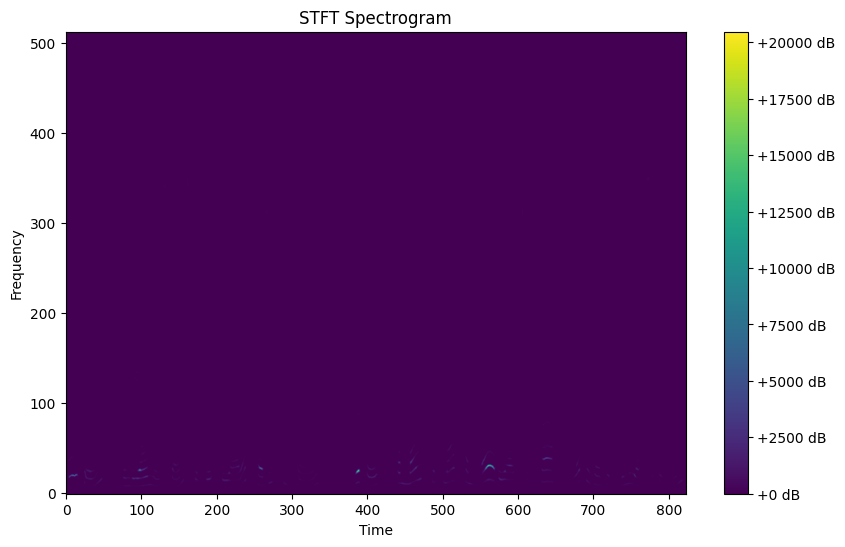

In [9]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt

# Check if CUDA is available and set the device
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

# Path to the folder with saved spectrograms
spectrogram_folder = 'stft_spectrograms'  # Folder where .npy spectrograms are saved
spectrogram_file = 'LJ001-0001.npy'  # Replace with the actual filename you want to visualize

# Full path to the spectrogram file
spectrogram_path = os.path.join(spectrogram_folder, spectrogram_file)

# Load the .npy file (saved spectrogram) and transfer to the GPU if available
spectrogram = np.load(spectrogram_path)

# Convert to a tensor and move to the GPU if necessary
spectrogram_tensor = torch.tensor(spectrogram).to(device)

# Transfer to CPU for visualization (required by matplotlib)
spectrogram_tensor = spectrogram_tensor.cpu().numpy()

# Plot the spectrogram using matplotlib
plt.figure(figsize=(10, 6))
plt.imshow(spectrogram_tensor[0], aspect='auto', origin='lower')
plt.colorbar(format='%+2.0f dB')
plt.title('STFT Spectrogram')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.show()


Mel Filterbank

In [10]:
import os
import numpy as np 
import torch
import torchaudio

# Check if CUDA is available and set the device
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

# Paths
input_folder = 'stft_spectrograms'  # Folder where the STFT spectrograms are stored
output_folder = 'mel_spectrograms'   # Folder to save the mel spectrograms
n_mels = 80  # Number of mel channels

# Create output folder if it doesn't exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Define mel scale transformation
mel_scale = torchaudio.transforms.MelScale(
    n_mels=n_mels, 
    sample_rate=22050,  # Ensure this matches your audio's sample rate
    n_stft=n_fft // 2 + 1  # Based on the FFT size (n_fft=1024 in previous steps)
).to(device)

# Loop through all STFT spectrogram files
for file_name in os.listdir(input_folder):
    if file_name.endswith('.npy'):
        # Full path to the input file
        input_file_path = os.path.join(input_folder, file_name)
        
        # Load the spectrogram from the .npy file
        spectrogram = np.load(input_file_path)
        spectrogram_tensor = torch.tensor(spectrogram).to(device)
        
        # Apply mel filterbank to the spectrogram
        mel_spectrogram = mel_scale(spectrogram_tensor)

        # Move the mel spectrogram back to CPU for saving
        mel_spectrogram = mel_spectrogram.cpu().numpy()

        # Full path to the output file
        output_file_path = os.path.join(output_folder, file_name)

        # Save the mel spectrogram as a .npy file
        np.save(output_file_path, mel_spectrogram)

        print(f"Converted {file_name} to mel spectrogram and saved as {output_file_path}")


Converted LJ001-0001.npy to mel spectrogram and saved as mel_spectrograms\LJ001-0001.npy
Converted LJ001-0002.npy to mel spectrogram and saved as mel_spectrograms\LJ001-0002.npy
Converted LJ001-0003.npy to mel spectrogram and saved as mel_spectrograms\LJ001-0003.npy
Converted LJ001-0004.npy to mel spectrogram and saved as mel_spectrograms\LJ001-0004.npy
Converted LJ001-0005.npy to mel spectrogram and saved as mel_spectrograms\LJ001-0005.npy
Converted LJ001-0006.npy to mel spectrogram and saved as mel_spectrograms\LJ001-0006.npy
Converted LJ001-0007.npy to mel spectrogram and saved as mel_spectrograms\LJ001-0007.npy
Converted LJ001-0008.npy to mel spectrogram and saved as mel_spectrograms\LJ001-0008.npy
Converted LJ001-0009.npy to mel spectrogram and saved as mel_spectrograms\LJ001-0009.npy
Converted LJ001-0010.npy to mel spectrogram and saved as mel_spectrograms\LJ001-0010.npy
Converted LJ001-0011.npy to mel spectrogram and saved as mel_spectrograms\LJ001-0011.npy
Converted LJ001-0012.

view specific melspectrograms

Using device: cpu


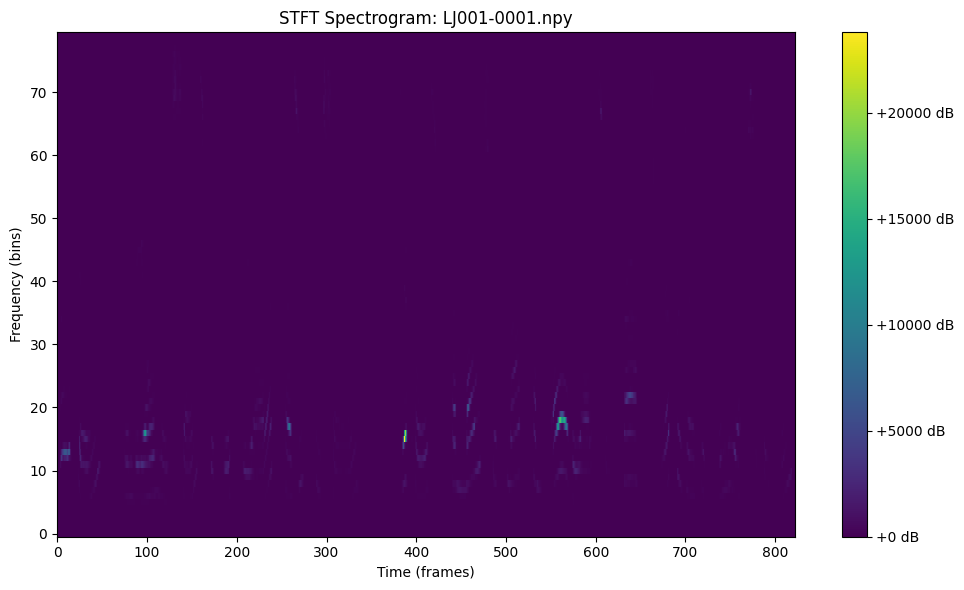

In [11]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt

# Check if CUDA is available and set the device
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Path to the folder with saved spectrograms
spectrogram_folder = 'mel_spectrograms'  # Folder where .npy spectrograms are saved

# Specify the actual filename you want to visualize (e.g., 'LJ001-0001.npy')
spectrogram_file = 'LJ001-0001.npy'

# Full path to the spectrogram file
spectrogram_path = os.path.join(spectrogram_folder, spectrogram_file)

# Check if the file exists
if os.path.exists(spectrogram_path):
    # Load the .npy file (saved spectrogram)
    spectrogram = np.load(spectrogram_path)

    # Remove extra dimensions if necessary (e.g., if shape is (1, freq, time))
    spectrogram = np.squeeze(spectrogram)

    # Convert to a tensor and move to the GPU if necessary
    spectrogram_tensor = torch.tensor(spectrogram).to(device)

    # Transfer to CPU for visualization (required by matplotlib)
    spectrogram_tensor = spectrogram_tensor.cpu().numpy()

    # Plot the spectrogram using matplotlib
    plt.figure(figsize=(10, 6))
    plt.imshow(spectrogram_tensor, aspect='auto', origin='lower', interpolation='none')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'STFT Spectrogram: {spectrogram_file}')
    plt.xlabel('Time (frames)')
    plt.ylabel('Frequency (bins)')
    plt.tight_layout()
    plt.show()
else:
    print(f"The file '{spectrogram_file}' does not exist in the folder '{spectrogram_folder}'.")


Log Scaling

In [12]:
import os
import numpy as np

# Paths
input_folder = 'mel_spectrograms'  # Folder where the mel spectrograms are stored
output_folder = 'log_scaled_mel_spectrograms'  # Folder to save the log mel spectrograms

# Create output folder if it doesn't exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Loop through all mel spectrogram files
for file_name in os.listdir(input_folder):
    if file_name.endswith('.npy'):
        # Full path to the input file
        input_file_path = os.path.join(input_folder, file_name)

        # Load the mel spectrogram from the .npy file
        mel_spectrogram = np.load(input_file_path)

        # Apply log scaling (add a small constant to avoid log(0))
        log_mel_spectrogram = np.log1p(mel_spectrogram)  # Using log1p for numerical stability

        # Save the log mel spectrogram as a .npy file
        output_file_path = os.path.join(output_folder, file_name)
        np.save(output_file_path, log_mel_spectrogram)

        print(f"Converted {file_name} to log mel spectrogram and saved as {output_file_path}")


Converted LJ001-0001.npy to log mel spectrogram and saved as log_scaled_mel_spectrograms\LJ001-0001.npy
Converted LJ001-0002.npy to log mel spectrogram and saved as log_scaled_mel_spectrograms\LJ001-0002.npy
Converted LJ001-0003.npy to log mel spectrogram and saved as log_scaled_mel_spectrograms\LJ001-0003.npy
Converted LJ001-0004.npy to log mel spectrogram and saved as log_scaled_mel_spectrograms\LJ001-0004.npy
Converted LJ001-0005.npy to log mel spectrogram and saved as log_scaled_mel_spectrograms\LJ001-0005.npy
Converted LJ001-0006.npy to log mel spectrogram and saved as log_scaled_mel_spectrograms\LJ001-0006.npy
Converted LJ001-0007.npy to log mel spectrogram and saved as log_scaled_mel_spectrograms\LJ001-0007.npy
Converted LJ001-0008.npy to log mel spectrogram and saved as log_scaled_mel_spectrograms\LJ001-0008.npy
Converted LJ001-0009.npy to log mel spectrogram and saved as log_scaled_mel_spectrograms\LJ001-0009.npy
Converted LJ001-0010.npy to log mel spectrogram and saved as log

In [13]:
import os
import numpy as np
import pandas as pd

# Directory where the mel spectrograms are stored
mel_dir = r'D:\7semproject\TTSS\log_scaled_mel_spectrograms'

# Initialize an empty list to store the file names and mel lengths
mel_lengths = []

# Iterate over all .npy files in the mel spectrograms folder
for file_name in os.listdir(mel_dir):
    if file_name.endswith('.npy'):
        mel_path = os.path.join(mel_dir, file_name)
        mel_spectrogram = np.load(mel_path)
        
        # Get the length of the mel spectrogram (number of frames)
        mel_length = mel_spectrogram.shape[2]  # Assuming the shape is (channels, n_mels, time)
        
        # Append the file name and its corresponding mel length
        mel_lengths.append((file_name, mel_length))

# Convert to DataFrame for easy saving
mel_lengths_df = pd.DataFrame(mel_lengths, columns=['filename', 'mel_length'])

# Find the maximum mel length in the dataset
max_mel_length = mel_lengths_df['mel_length'].max()
print(f"Max mel length: {max_mel_length}")

# Add the max mel length as a new row in the DataFrame using pd.concat
max_mel_length_df = pd.DataFrame([{'filename': 'max_mel_length', 'mel_length': max_mel_length}])
mel_lengths_df = pd.concat([mel_lengths_df, max_mel_length_df], ignore_index=True)

# Save the result to a new CSV file
output_csv = r'D:\7semproject\TTSS\mel_lengths.csv'
mel_lengths_df.to_csv(output_csv, index=False)

print(f"Mel lengths saved to: {output_csv}")


Max mel length: 863
Mel lengths saved to: D:\7semproject\TTSS\mel_lengths.csv


In [2]:
import numpy as np
import csv

def get_max_mel_length(filelist_path):
    max_length = 0
    
    with open(filelist_path, 'r', encoding='utf-8') as f:
        reader = csv.DictReader(f)
        # Clean up field names by stripping quotes
        reader.fieldnames = [field.strip('"') for field in reader.fieldnames]
        
        for row in reader:
            processed_audio_path = row["processed_audio_path"].strip().strip('"')
            mel = np.load(processed_audio_path)  # Load the mel spectrogram
            mel_length = mel.shape[1]  # Assuming shape is (80, mel_length)

            if mel_length > max_length:
                max_length = mel_length
    
    return max_length

# Usage
filelist_path = r'D:\7semproject\TTSS\text_to_speech_tacotron2\tacotron2\filelists\train_data.csv'  # Correct path to your CSV file
max_mel_length = get_max_mel_length(filelist_path)
print(f"Maximum mel length: {max_mel_length}")


Maximum mel length: 80


In [1]:
import numpy as np
import csv

def get_max_mel_tensor_size(filelist_path):
    max_freq_bins = 0
    max_length = 0
    
    with open(filelist_path, 'r', encoding='utf-8') as f:
        reader = csv.DictReader(f)
        # Clean up field names by stripping quotes
        reader.fieldnames = [field.strip('"') for field in reader.fieldnames]
        
        for row in reader:
            processed_audio_path = row["processed_audio_path"].strip().strip('"')
            mel = np.load(processed_audio_path)  # Load the mel spectrogram
            
            # Debugging: print the shape of the mel tensor
            print(f"Loaded mel shape: {mel.shape}")  # Add this line to check the shape
            
            # Check if the mel tensor has 2 dimensions
            if mel.ndim == 2:
                num_freq_bins, mel_length = mel.shape
            elif mel.ndim == 3:
                # Handle case where mel tensor has 3 dimensions (e.g., (1, num_freq_bins, mel_length))
                num_freq_bins, mel_length = mel[0].shape  # Adjust as necessary
            else:
                print(f"Unexpected mel shape: {mel.shape}")
                continue  # Skip this mel if it doesn't have the expected dimensions

            # Update max sizes
            max_freq_bins = max(max_freq_bins, num_freq_bins)
            max_length = max(max_length, mel_length)
    
    return max_freq_bins, max_length

# Usage
filelist_path = r'combined_audio_metadata.csv'  # Correct path to your CSV file
max_freq_bins, max_mel_length = get_max_mel_tensor_size(filelist_path)
print(f"Maximum frequency bins: {max_freq_bins}")
print(f"Maximum mel length: {max_mel_length}")


Loaded mel shape: (1, 80, 823)
Loaded mel shape: (1, 80, 153)
Loaded mel shape: (1, 80, 823)
Loaded mel shape: (1, 80, 425)
Loaded mel shape: (1, 80, 687)
Loaded mel shape: (1, 80, 481)
Loaded mel shape: (1, 80, 713)
Loaded mel shape: (1, 80, 139)
Loaded mel shape: (1, 80, 639)
Loaded mel shape: (1, 80, 753)
Loaded mel shape: (1, 80, 373)
Loaded mel shape: (1, 80, 703)
Loaded mel shape: (1, 80, 215)
Loaded mel shape: (1, 80, 839)
Loaded mel shape: (1, 80, 789)
Loaded mel shape: (1, 80, 447)
Loaded mel shape: (1, 80, 583)
Loaded mel shape: (1, 80, 635)
Loaded mel shape: (1, 80, 537)
Loaded mel shape: (1, 80, 389)
Loaded mel shape: (1, 80, 735)
Loaded mel shape: (1, 80, 595)
Loaded mel shape: (1, 80, 715)
Loaded mel shape: (1, 80, 671)
Loaded mel shape: (1, 80, 731)
Loaded mel shape: (1, 80, 515)
Loaded mel shape: (1, 80, 823)
Loaded mel shape: (1, 80, 503)
Loaded mel shape: (1, 80, 429)
Loaded mel shape: (1, 80, 589)
Loaded mel shape: (1, 80, 665)
Loaded mel shape: (1, 80, 595)
Loaded m

In [14]:
import numpy as np
mel_data = np.load("D:/7semproject/TTSS/log_scaled_mel_spectrograms/LJ001-0001.npy")
print("Mel data shape:", mel_data.shape)

Mel data shape: (1, 80, 823)


In [2]:
from pydub import AudioSegment
import os

input_folder = "D:\\7semproject\\LjSpeech\\wavs"  # Folder with your audio files
output_folder = "D:\\7semproject\\LjSpeech\\converted_wavs"  # Output folder for WAV files

if not os.path.exists(output_folder):
    os.makedirs(output_folder)

for filename in os.listdir(input_folder):
    file_path = os.path.join(input_folder, filename)
    try:
        # Attempt to load the file using pydub
        audio = AudioSegment.from_file(file_path)
        output_file_path = os.path.join(output_folder, f"{os.path.splitext(filename)[0]}.wav")
        audio.export(output_file_path, format="wav")
        print(f"Converted {filename} to WAV format.")
    except Exception as e:
        print(f"Skipping {filename}: Invalid format or failed to convert. Error: {e}")


Converted LJ001-0001.wav to WAV format.
Converted LJ001-0002.wav to WAV format.
Converted LJ001-0003.wav to WAV format.
Converted LJ001-0004.wav to WAV format.
Converted LJ001-0005.wav to WAV format.
Converted LJ001-0006.wav to WAV format.
Converted LJ001-0007.wav to WAV format.
Converted LJ001-0008.wav to WAV format.
Converted LJ001-0009.wav to WAV format.
Converted LJ001-0010.wav to WAV format.
Converted LJ001-0011.wav to WAV format.
Converted LJ001-0012.wav to WAV format.
Converted LJ001-0013.wav to WAV format.
Converted LJ001-0014.wav to WAV format.
Converted LJ001-0015.wav to WAV format.
Converted LJ001-0016.wav to WAV format.
Converted LJ001-0017.wav to WAV format.
Converted LJ001-0018.wav to WAV format.
Converted LJ001-0019.wav to WAV format.
Converted LJ001-0020.wav to WAV format.
Converted LJ001-0021.wav to WAV format.
Converted LJ001-0022.wav to WAV format.
Converted LJ001-0023.wav to WAV format.
Converted LJ001-0024.wav to WAV format.
Converted LJ001-0025.wav to WAV format.


In [6]:
from scipy.io import wavfile

file_path = "D:\\7semproject\\LjSpeech\\wavs\\LJ001-0004.wav"  # Change this to the path of your WAV file
try:
    sampling_rate, data = wavfile.read(file_path)
    print(f"Successfully read {file_path} with sampling rate: {sampling_rate} and data shape: {data.shape}")
except Exception as e:
    print(f"Error reading {file_path}: {e}")


Successfully read D:\7semproject\LjSpeech\wavs\LJ001-0004.wav with sampling rate: 22050 and data shape: (113309,)


In [8]:
import os
import numpy as np
from scipy.io import wavfile

# Specify the directory containing your WAV files
directory = "D:\\7semproject\\LjSpeech\\wavs"

# Function to check if the file is a valid WAV file
def is_valid_wav(file_path):
    with open(file_path, 'rb') as f:
        # Read the first 4 bytes to check the header
        header = f.read(4)
        # Check for 'RIFF' header
        return header == b'RIFF'

# Initialize counters for valid and invalid files
valid_files_count = 0
invalid_files_count = 0

# Iterate over all files in the directory
for filename in os.listdir(directory):
    if filename.endswith(".wav"):  # Check if the file is a WAV file
        file_path = os.path.join(directory, filename)
        
        # Check if the file is a valid WAV format
        if not is_valid_wav(file_path):
            print(f"Skipping {file_path}: Invalid WAV format (header check failed).")
            invalid_files_count += 1
            continue
        
        try:
            # Attempt to read the WAV file
            sampling_rate, data = wavfile.read(file_path)
            print(f"Successfully read {file_path} with sampling rate: {sampling_rate} and data shape: {data.shape}")
            valid_files_count += 1
        except ValueError as e:
            print(f"Error reading {file_path}: {e}")
            invalid_files_count += 1
        except Exception as e:
            print(f"Unexpected error reading {file_path}: {e}")
            invalid_files_count += 1

# Summary of processing
print(f"\nSummary: {valid_files_count} valid files, {invalid_files_count} invalid files.")


Successfully read D:\7semproject\LjSpeech\wavs\LJ001-0001.wav with sampling rate: 22050 and data shape: (212893,)
Successfully read D:\7semproject\LjSpeech\wavs\LJ001-0002.wav with sampling rate: 22050 and data shape: (41885,)
Successfully read D:\7semproject\LjSpeech\wavs\LJ001-0003.wav with sampling rate: 22050 and data shape: (213149,)
Successfully read D:\7semproject\LjSpeech\wavs\LJ001-0004.wav with sampling rate: 22050 and data shape: (113309,)
Successfully read D:\7semproject\LjSpeech\wavs\LJ001-0005.wav with sampling rate: 22050 and data shape: (178845,)
Successfully read D:\7semproject\LjSpeech\wavs\LJ001-0006.wav with sampling rate: 22050 and data shape: (125341,)
Successfully read D:\7semproject\LjSpeech\wavs\LJ001-0007.wav with sampling rate: 22050 and data shape: (184989,)
Successfully read D:\7semproject\LjSpeech\wavs\LJ001-0008.wav with sampling rate: 22050 and data shape: (39325,)
Successfully read D:\7semproject\LjSpeech\wavs\LJ001-0009.wav with sampling rate: 22050 an

In [1]:
import numpy as np

# Path to your .npy file
mel_path = "D:\\7semproject\\TTSS\\log_scaled_mel_spectrograms\\LJ001-0001.npy"

# Load the .npy file
mel_spectrogram = np.load(mel_path)

# Print the shape of the mel spectrogram
print(f"Shape of mel spectrogram: {mel_spectrogram.shape}")


Shape of mel spectrogram: (1, 80, 823)
